In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import os
import numpy as np
import cv2
import imutils
import random
# import mahotas

from IPython.display import display, Image
from matplotlib import pyplot as plt

%matplotlib inline

In [2]:
airplane_datapath = "/Users/sam/All-Program/App-DataSet/CIFAR10/trainDataAirplane/"
cat_datapath = "/Users/sam/All-Program/App-DataSet/CIFAR10/trainDataCat/"

In [3]:
dirDict = [airplane_datapath,cat_datapath]

imagePath = []
for dirs in dirDict:
    dir_arr = os.listdir(dirs)
    random.shuffle(dir_arr)
    files = dir_arr[10:50]
    imagePath += [dirs+f for f in files]
# print (imagePath)

In [4]:
def vizualize(imageArray, rows, columns, figsize=(40, 6)):
    fig1, axs = plt.subplots(rows,columns, figsize=figsize, facecolor='y', edgecolor='k')
    if columns>1:
        axs = axs.ravel()
    for no, image in enumerate(imageArray):
        axs[no].imshow(image)

In [5]:
def image_standarize1(image):
    return(image - 255.0/2)/255.0

def image_standarize2(image):
    return(image/255.0)

In [6]:
# Load the images using openCV
imageArr = [cv2.imread(img) for img in imagePath] 
# Note : Open CV reads an Image in BGR, so we have to convert it into RBG
imageArr = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in imageArr]
vizualize(imageArr,rows=4,columns=20)

In [7]:
# # Load the images using openCV
# imageArr = [cv2.imread(img) for img in imagePath] 
# # Note : Open CV reads an Image in BGR, so we have to convert it into RBG
# imageArr = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for num,img in enumerate(imageArr) if num in [4,26,45,73]]
# # vizualize(imageArr,rows=4,columns=20)
# vizualize(imageArr,rows=2,columns=2, figsize=(10,10))

## TensorFlow Image Preprocessing Operations:
------

In [8]:
def reset_graph():  # Reset the graph
    if 'sess' in globals() and sess:
        sess.close()
    tf.reset_default_graph()

(80, 32, 32, 3)
The shape of input image Tnsor is:  (80, 32, 32, 3)
80
{'distorted_image': <tf.Tensor 'div:0' shape=(32, 32, 3) dtype=float32>, 'imageIN': <tf.Tensor 'Placeholder:0' shape=(32, 32, 3) dtype=float32>}


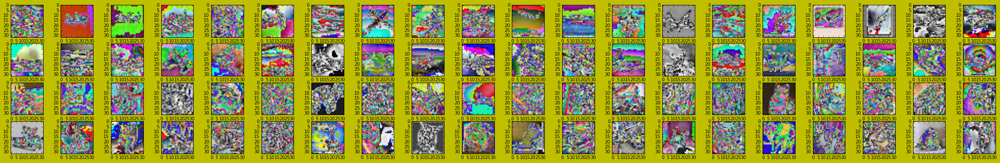

In [9]:
# Vizualizing Tensorflow operation

# Note Tensor flow takes input of 4 tensors, 
from scipy import misc
import tensorflow as tf

###############
imgTensor = np.ndarray(shape=(80,32,32,3), dtype='uint8')  # uint8 is defined for images: that takes on values between 0 and 255
print (imgTensor.shape)
for i,img in enumerate(imageArr):
    imgTensor[i,:] = img
    
print ('The shape of input image Tnsor is: ', imgTensor.shape)

# Now lets imagine the inputTensor is one batch of 80 images and we now do tensor flow image processing operation on it.
# def inputs(imgIN):
def imagePreprocessing(imageSize, numChannels):
    
    '''
        Normally the inputs have dtype unit8 (0-255), We however take the input as float32 because we perform 
        operations like brightness, contrast and whitening that doest arithmatic operation which many make the 
        pixels value as floating point.
    '''
    imageIN = tf.placeholder(tf.float32, [imageSize, imageSize, numChannels])
    
    # Crop a portion from the image
#     distorted_image = tf.random_crop(distorted_image, [32, 32, 3])       # Given an image this operation will make a random crop of the image given the crop size
    
    # Flip the image
    distorted_image = tf.image.random_flip_left_right(imageIN)   # Given an image this operation may or may not flip the image
    # Add random brightness
    distorted_image = tf.image.random_brightness(distorted_image,max_delta=63)
    # Add random contrast
    distorted_image = tf.image.random_contrast(distorted_image,lower=0.2, upper=1.8)
    # Standarize: # Subtract off the mean and divide by the variance of the pixels.:
    distorted_image = tf.image.per_image_standardization(distorted_image)
    
    return dict(imageIN=imageIN,
                 distorted_image=distorted_image)
#     return distorted_image



print (imgTensor.shape[0])
#     return distorted_image

reset_graph()
processGraphDict = imagePreprocessing(imageSize=32, numChannels=3)
print (processGraphDict)
with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())

    trainPreprocessOUT = np.ndarray(shape=(80,32,32,3), dtype='float32')
    for numImage in np.arange(imgTensor.shape[0]):
        feed_dict = {processGraphDict['imageIN']:imgTensor[numImage,:]}
        im_distorted = sess.run(processGraphDict['distorted_image'],feed_dict=feed_dict)
#         print (im_distorted)
        trainPreprocessOUT[numImage,:] = im_distorted

# print (trainPreprocessOUT)
imgOut = []
for numimg in np.arange(trainPreprocessOUT.shape[0]):
#     print (trainPreprocessOUT[numimg,:])
    imgOut.append(trainPreprocessOUT[numimg,:])
    
vizualize(imgOut,rows=4,columns=20)


## OpenCV Image Preprocessing Opereations:
------

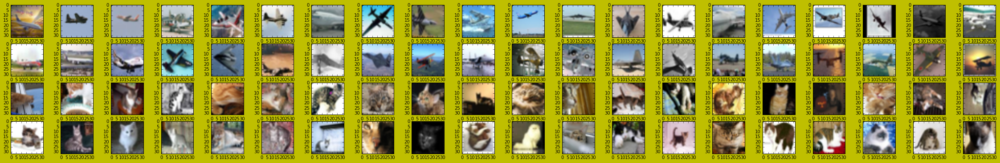

In [10]:
imgHFliped = [cv2.flip(img,1) for img in imageArr]
vizualize(imgHFliped, rows=4,columns=20)

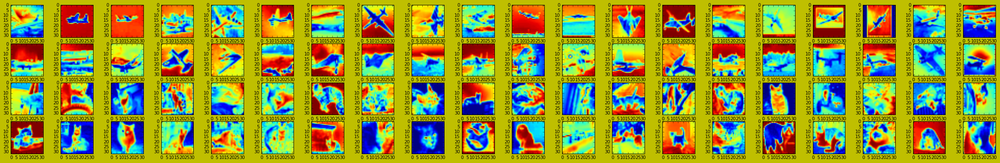

In [11]:
imageGray = [cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) for img in imageArr] 
vizualize(imageGray,rows=4,columns=20)

In [12]:
# # Load the images using openCV
# # imageArr = [cv2.imread(img) for img in imagePath] 
# # Note : Open CV reads an Image in BGR, so we have to convert it into RBG


# # output for output in hog_feature(featureParams5 ,imageType)


# imageArr = [cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) for num, img in enumerate(imageArr) if num in [4,26,45,73]]
# # vizualize(imageArr,rows=4,columns=20)
# vizualize(imageArr,rows=2,columns=2, figsize=(10,10))

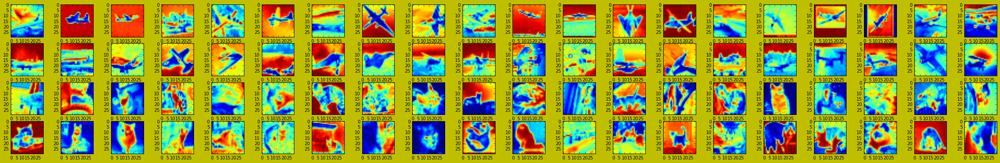

In [13]:
imageGrayCrop = [img[1:31, 1:31] for img in imageGray] 
vizualize(imageGrayCrop,rows=4,columns=20)

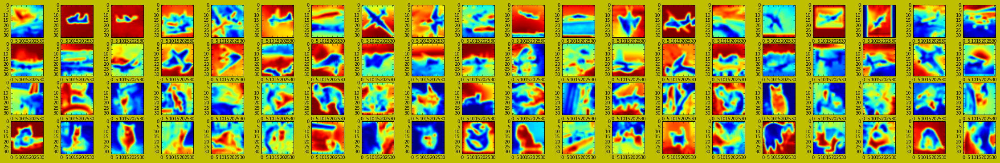

In [14]:
# Applyting Gaussian blurr blurr to the pictures
imageBlurr = [cv2.GaussianBlur(img, (3,3),3) for img in imageGray]
# A bigger value of sigma will result in better smooting. Since the image we are operating on is pretty small we would want to use a small kernel (filter) 
# and a small value of sigma
vizualize(imageBlurr,rows=4,columns=20)
# print (imageBlurr)

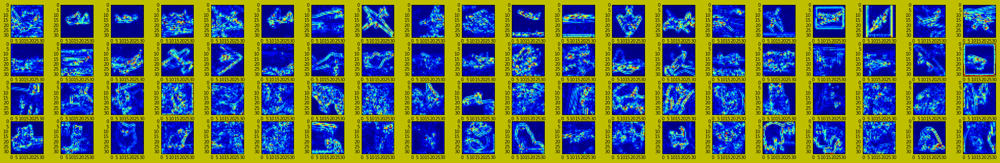

In [15]:
# Applying Edge detection Techniques, 1. Laplse Edge Detector.
imageLapEdge = [cv2.Laplacian(img, cv2.CV_64F) for img in imageGray]
imageLapEdge = np.uint8(np.absolute(imageLapEdge))
vizualize(imageLapEdge,rows=4,columns=20)

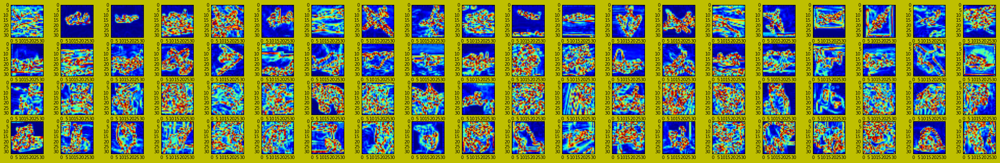

In [16]:
# Applying Edge detection Techniques, 1. Sobel Edge Detector.
# Now we shall use Sobel operator top determine the horizontal and vertical edges
def sobelEdge(img):
    sobelX= cv2.Sobel(img, cv2.CV_64F,1,0)
    sobelY= cv2.Sobel(img, cv2.CV_64F,0,1)
    sobelX = np.uint8(np.absolute(sobelX))#np.absolute(sobelX)
    sobelY = np.uint8(np.absolute(sobelY))#np.absolute(sobelY)
    sobelCombined = cv2.bitwise_or(sobelX, sobelY)
    return sobelCombined

imageSobEdge = [sobelEdge(img) for img in imageGray]
vizualize(imageSobEdge,rows=4,columns=20)

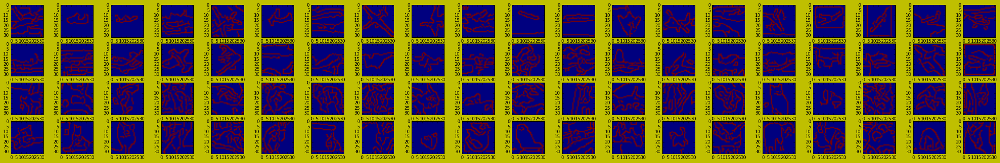

In [17]:
imageCannyEdge = [cv2.Canny(img, 30, 150) for img in imageBlurr]
vizualize(imageCannyEdge,rows=4,columns=20)

In [18]:
# # Load the images using openCV
# # imageArr = [cv2.imread(img) for img in imagePath] 
# # Note : Open CV reads an Image in BGR, so we have to convert it into RBG
# imageArr = [cv2.Canny(img, 30, 150) for num,img in enumerate(imageBlurr) if num in [4,26,45,73]]
# # vizualize(imageArr,rows=4,columns=20)
# vizualize(imageArr,rows=2,columns=2, figsize=(10,10))

## Skew the image , wrapaffine and ceter the image. (Have to work on it)

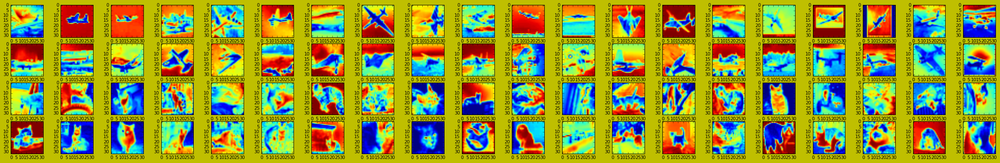

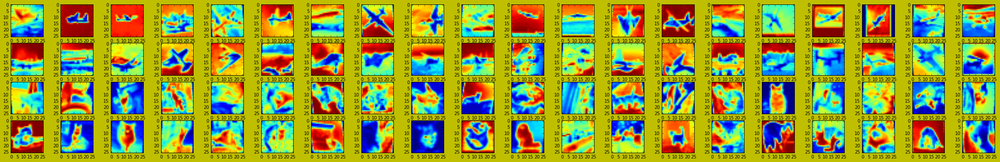

In [19]:
# Doesnt Work, Have to re do

def deskew(image, width):
#     print (image.shape)
    (h, w) = image.shape[:2]
#     print (h, w)
    moments = cv2.moments(image)
#     print (moments)
    skew = moments["mu11"] / moments["mu02"]
#     print (skew)
    M = np.float32([[1, skew, -0.5 * w * skew],[0, 1, 0]])
#     print (M)
    image = cv2.warpAffine(image, M, (w, h),
       flags = cv2.WARP_INVERSE_MAP | cv2.INTER_LINEAR)
#     print (image.shape)
    image = imutils.resize(image, width = width)
    return image

imgSkewed = [deskew(img, width=26) for no,img in enumerate(imageGray)]
vizualize(imageGray,rows=4,columns=20)
vizualize(imgSkewed,rows=4,columns=20)

## It is a good idea to center the image:

/Users/sam/App-Setup/CondaENV/lib/python3.5/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


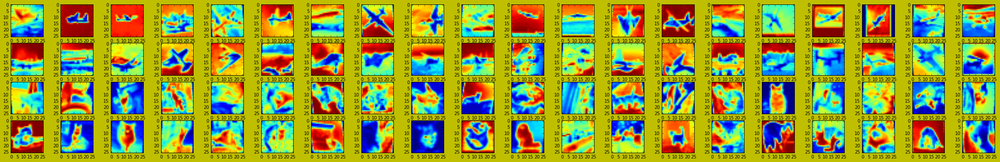

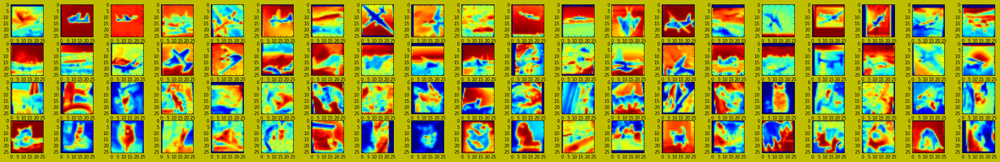

In [20]:
# Doesnt Work, Have to re do

def center_extent(image, size):
    (eW, eH) = size
    
    if image.shape[1] > image.shape[0]:
        image = imutils.resize(image, width = eW)
    else:
        image = imutils.resize(image, height = eH)
        
    extent = np.zeros((eH, eW), dtype = "uint8")
    offsetX = (eW - image.shape[1]) / 2
    offsetY = (eH - image.shape[0]) / 2
    
    extent[offsetY:offsetY + image.shape[0], offsetX:offsetX + image.shape[1]] = image
    CM = mahotas.center_of_mass(extent)
    (cY, cX) = np.round(CM).astype("int32")
    (dX, dY) = ((size[0] / 2) - cX, (size[1] / 2) - cY)
    M = np.float32([[1, 0, dX], [0, 1, dY]])
    extent = cv2.warpAffine(extent, M, size)
    
    return extent

# image = dataset.center_extent(image, (26, 26))
imgCenter = [center_extent(img, size=(26,26)) for no,img in enumerate(imgSkewed)]
vizualize(imgSkewed,rows=4,columns=20)
vizualize(imgCenter,rows=4,columns=20)

## HOG discreptor 
------
We also print the histograms to get a intuitive sense if the parameters we use makes sense or not.

In [21]:
from skimage.feature import hog

class HOG:
    def __init__(self, featureParams): 
        self.orienations = featureParams['orientations']
        self.pixelsPerCell = featureParams['pixelsPerCell']
        self.cellsPerBlock = featureParams['cellsPerBlock']
        self.block_norm = featureParams['block_norm']
        self.visualise = featureParams['visualise']
        self.transform_sqrt = featureParams['transform_sqrt']

    def describe(self, image):
        # Use transform_sqrt for Power law Compression before processing the image to increase the accuracy
        # Use visualise to return the image of the histogram
        if self.visualise:
            hist, hog_image = hog(image,
                                orientations = self.orienations,
                                pixels_per_cell = self.pixelsPerCell,
                                cells_per_block = self.cellsPerBlock,
                                visualise= self.visualise,
                                transform_sqrt = self.transform_sqrt)
            return hist, hog_image
        else:
            hog_image = hog(image,
                                orientations = self.orienations,
                                pixels_per_cell = self.pixelsPerCell,
                                cells_per_block = self.cellsPerBlock,
                                transform_sqrt = self.transform_sqrt)
            return hog_image



def hog_feature(featureParams,image_in):
#     print (featureParams)
    obj_HOG = HOG(featureParams)
    for no,img in enumerate(image_in):
        hist, hog_image = obj_HOG.describe(img)
        yield hog_image

In [22]:
# Vizualizing Tensorflow operation

# Note Tensor flow takes input of 4 tensors, 
from scipy import misc
import tensorflow as tf

###############
imgTensor = np.ndarray(shape=(80,32,32), dtype='uint8')  # uint8 is defined for images: that takes on values between 0 and 255
print (imgTensor.shape)
for i,img in enumerate(imageGray):
    imgTensor[i,:] = img
    
print ('The shape of input image Tnsor is: ', imgTensor.shape)




featureParams3_1 = dict(orientations = 9, pixelsPerCell = (2, 2), cellsPerBlock = (1, 1), block_norm = 'L1', visualise = False, transform_sqrt = True)
featureParams3_2 = dict(orientations = 9, pixelsPerCell = (4, 4), cellsPerBlock = (1, 1), block_norm = 'L1', visualise = False, transform_sqrt = True)
featureParams3_3 = dict(orientations = 9, pixelsPerCell = (6, 6), cellsPerBlock = (1, 1), block_norm = 'L1', visualise = False, transform_sqrt = True)
featureParams3_4 = dict(orientations = 9, pixelsPerCell = (8, 8), cellsPerBlock = (1, 1), block_norm = 'L1', visualise = False, transform_sqrt = True)

obj_HOG_p3_1 = HOG(featureParams3_1)
obj_HOG_p3_2 = HOG(featureParams3_2)
obj_HOG_p3_3 = HOG(featureParams3_3)
obj_HOG_p3_4 = HOG(featureParams3_4)

def pyfunction(inputIN):
    imgHOGp3_1 = obj_HOG_p3_1.describe(inputIN)             # We collect the HOG image pertaining to the first parameter settings
    imgHOGp3_2 = obj_HOG_p3_2.describe(inputIN)
    imgHOGp3_3 = obj_HOG_p3_3.describe(inputIN)
    imgHOGp3_4 = obj_HOG_p3_4.describe(inputIN)
    featureHOG = np.hstack((imgHOGp3_1,imgHOGp3_2,imgHOGp3_3,imgHOGp3_4)) 
    numFeatures = len(featureHOG)
    return np.array(featureHOG, dtype='float32').reshape(1,numFeatures)

class BuildNeuralNet():
    def __init__(self):
        self.numChannels =1
        self.imageSize = 32
        
    def imagePreprocessing(self):

        '''
            Normally the inputs have dtype unit8 (0-255), We however take the input as float32 because we perform 
            operations like brightness, contrast and whitening that doest arithmatic operation which many make the 
            pixels value as floating point.
        '''
        imageIN = tf.placeholder(tf.float32, [self.imageSize, self.imageSize, 1])
        # Flip the image
        distorted_image = tf.image.random_flip_left_right(imageIN)   # Given an image this operation may or may not flip the image

        distorted_image = tf.reshape(distorted_image, [self.imageSize, self.imageSize])

        featureHOG = tf.py_func(pyfunction, [distorted_image], tf.float32)

        return dict(imageIN=imageIN,
                     featureHOG=featureHOG)


class SessionExec():
    def __init__(self):
        self.imageSize = 32
        self.numChannels =1
        
    def execute(self, imgTensor):
        reset_graph()
        obj_NN = BuildNeuralNet()
        processGraphDict = obj_NN.imagePreprocessing()
        print (processGraphDict)
        
        with tf.Session() as sess:
            sess.run(tf.global_variables_initializer())

            trainPreprocessOUT = None #np.ndarray(shape=(80,32,32), dtype='float32')
            for numImage in np.arange(imgTensor.shape[0]):
        #         print ('running Image NUM: ', numImage)
                imageIN = imgTensor[numImage,:].reshape([imgTensor.shape[1], imgTensor.shape[2], 1])
#                 print (imageIN.shape)
                feed_dict = {processGraphDict['imageIN']:imageIN}   # reshaped to 32x32x1 as tensorflow operation asuums an image contai 3 Tensors 
                feature_hog = sess.run(processGraphDict['featureHOG'],feed_dict=feed_dict)
                if trainPreprocessOUT is None:
                    trainPreprocessOUT = feature_hog
                else:
                    trainPreprocessOUT = np.vstack((trainPreprocessOUT, feature_hog))
        return trainPreprocessOUT

    
trainPreprocessOUT = SessionExec().execute(imgTensor)
print (trainPreprocessOUT.shape)






# class SessionExec():
    
#     def execute(self, imgTensor):
#         reset_graph()
#         obj_NN = BuildNeuralNet()
#         processGraphDict = obj_NN.imagePreprocessing()
#         print (processGraphDict)
#         with tf.Session() as sess:
#             sess.run(tf.global_variables_initializer())

#             trainPreprocessOUT = []#np.ndarray(shape=(80,32,32), dtype='float32')
#             for numImage in np.arange(imgTensor.shape[0]):
#         #         print ('running Image NUM: ', numImage)
#                 feed_dict = {processGraphDict['imageIN']:imgTensor[numImage,:].reshape([imgTensor.shape[1], imgTensor.shape[2],1])}
#                 feature_hog = sess.run(processGraphDict['featureHOG'],feed_dict=feed_dict)
#         #         print ('The HOG feature out is: ', feature_hog.shape)
#         #         print (im_distorted)
#                 trainPreprocessOUT.append(feature_hog)
#         #         trainPreprocessOUT[numImage,:] = feature_hog
#         return trainPreprocessOUT








# print (trainPreprocessOUT)
# imgOut = []
# for numimg in np.arange(trainPreprocessOUT.shape[0]):
# #     print (trainPreprocessOUT[numimg,:])
#     imgOut.append(trainPreprocessOUT[numimg,:])
    
# vizualize(imgOut,rows=4,columns=20)






(80, 32, 32)
The shape of input image Tnsor is:  (80, 32, 32)
{'imageIN': <tf.Tensor 'Placeholder:0' shape=(32, 32, 1) dtype=float32>, 'featureHOG': <tf.Tensor 'PyFunc:0' shape=<unknown> dtype=float32>}
(80, 3249)


In [23]:
out = None
a = np.array([1,2,3,4,5])
print (a)
a = a.reshape(1,5)
print (a)
b = np.array([6,7,8,9,10])
print (b)
b = b.reshape(1,5)
print(b)

if not out:
    out = a

out = np.vstack((out,b))
print (out)
print (out.shape)

[1 2 3 4 5]
[[1 2 3 4 5]]
[ 6  7  8  9 10]
[[ 6  7  8  9 10]]
[[ 1  2  3  4  5]
 [ 6  7  8  9 10]]
(2, 5)


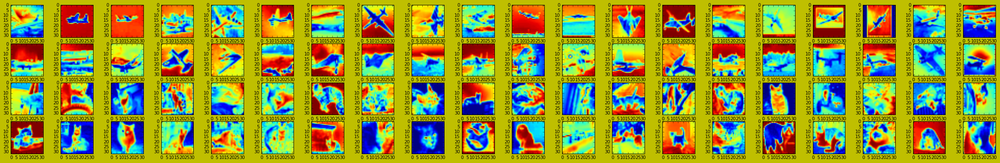

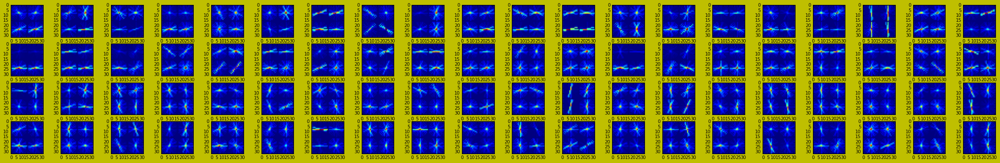

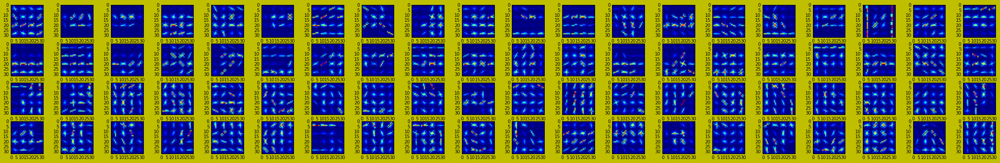

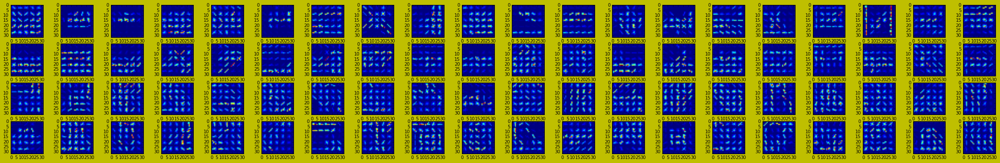

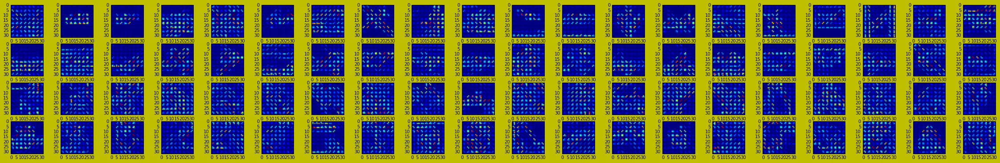

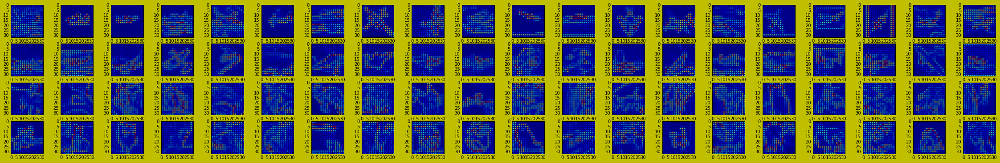

In [24]:
featureParams1 = dict(orientations = 18, pixelsPerCell = (16,16), cellsPerBlock = (1, 1), block_norm = 'L1', visualise = True, transform_sqrt = True)
featureParams2 = dict(orientations = 18, pixelsPerCell = (8,8), cellsPerBlock = (1, 1), block_norm = 'L1', visualise = True, transform_sqrt = True)
featureParams3 = dict(orientations = 18, pixelsPerCell = (6,6), cellsPerBlock = (1, 1), block_norm = 'L1', visualise = True, transform_sqrt = True)
# featureParams2 = dict(orientations = 9, pixelsPerCell = (6, 6), cellsPerBlock = (2, 2), block_norm = 'L1', visualise = True, transform_sqrt = True)
# featureParams3 = dict(orientations = 8, pixelsPerCell = (6, 6), cellsPerBlock = (2, 2), block_norm = 'L1', visualise = True, transform_sqrt = True)

featureParams4 = dict(orientations = 18, pixelsPerCell = (4, 4), cellsPerBlock = (1, 1), block_norm = 'L1', visualise = True, transform_sqrt = True)
featureParams5 = dict(orientations = 18, pixelsPerCell = (2, 2), cellsPerBlock = (1, 1), block_norm = 'L1', visualise = True, transform_sqrt = True)
# featureParams5 = dict(orientations = 9, pixelsPerCell = (4, 4), cellsPerBlock = (1, 1), block_norm = 'L1', visualise = True, transform_sqrt = True)
# featureParams6 = dict(orientations = 8, pixelsPerCell = (4, 4), cellsPerBlock = (1, 1), block_norm = 'L1', visualise = True, transform_sqrt = True)

# featureParams7 = dict(orientations = 18, pixelsPerCell = (2, 2), cellsPerBlock = (1, 1), block_norm = 'L1', visualise = True, transform_sqrt = True)
# featureParams1 = dict(orientations = 18, pixelsPerCell = (6, 6), cellsPerBlock = (2, 2), block_norm = 'L1', visualise = True, transform_sqrt = True)
# featureParams8 = dict(orientations = 9, pixelsPerCell = (2, 2), cellsPerBlock = (1, 1), block_norm = 'L1', visualise = True, transform_sqrt = True)
# featureParams9 = dict(orientations = 8, pixelsPerCell = (2, 2), cellsPerBlock = (1, 1), block_norm = 'L1', visualise = True, transform_sqrt = True)

imageType = imageGray

hogImageArr1 = [output for output in hog_feature(featureParams1 ,imageType)]
hogImageArr2 = [output for output in hog_feature(featureParams2 ,imageType)]
hogImageArr3 = [output for output in hog_feature(featureParams3 ,imageType)]
hogImageArr4 = [output for output in hog_feature(featureParams4 ,imageType)]
hogImageArr5 = [output for output in hog_feature(featureParams5 ,imageType)]
# hogImageArr6 = [output for output in hog_feature(featureParams6 ,imageType)]
# hogImageArr7 = [output for output in hog_feature(featureParams7 ,imageType)]
# hogImageArr8 = [output for output in hog_feature(featureParams8 ,imageType)]
# hogImageArr9 = [output for output in hog_feature(featureParams9 ,imageType)]

vizualize(imageType,rows=4,columns=20)
vizualize(hogImageArr1,rows=4,columns=20)
vizualize(hogImageArr2,rows=4,columns=20)
vizualize(hogImageArr3,rows=4,columns=20)
vizualize(hogImageArr4,rows=4,columns=20)
vizualize(hogImageArr5,rows=4,columns=20)
# vizualize(hogImageArr6,rows=4,columns=20)
# vizualize(hogImageArr7,rows=4,columns=20)
# vizualize(hogImageArr8,rows=4,columns=20)
# vizualize(hogImageArr9,rows=4,columns=20)

In [25]:
# # Load the images using openCV
# # imageArr = [cv2.imread(img) for img in imagePath] 
# # Note : Open CV reads an Image in BGR, so we have to convert it into RBG


# # output for output in hog_feature(featureParams5 ,imageType)


# imageArr = [output for num,output in enumerate(hog_feature(featureParams4 ,imageType)) if num in [4,26,45,73]]
# # vizualize(imageArr,rows=4,columns=20)
# vizualize(imageArr,rows=2,columns=2, figsize=(10,10))

(80, 32, 32)
The shape of input image Tnsor is:  (80, 32, 32)
{'imageIN': <tf.Tensor 'Placeholder:0' shape=(32, 32, 1) dtype=float32>, 'featureHOG': <tf.Tensor 'PyFunc:0' shape=<unknown> dtype=float32>}


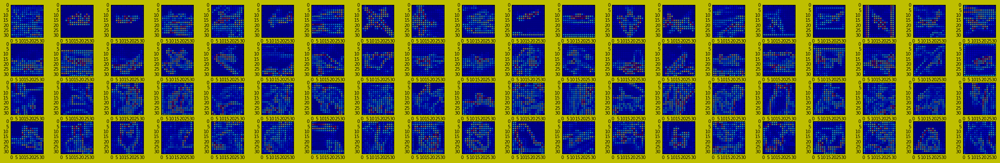

In [26]:
# Vizualizing Tensorflow operation

# Note Tensor flow takes input of 4 tensors, 
from scipy import misc
import tensorflow as tf

###############
imgTensor = np.ndarray(shape=(80,32,32), dtype='uint8')  # uint8 is defined for images: that takes on values between 0 and 255
print (imgTensor.shape)
for i,img in enumerate(imageGray):
    imgTensor[i,:] = img
    
print ('The shape of input image Tnsor is: ', imgTensor.shape)


featureParams3_1 = dict(orientations = 9, pixelsPerCell = (2, 2), cellsPerBlock = (1, 1), block_norm = 'L1', visualise = True, transform_sqrt = True)
obj_HOG_p3_1 = HOG(featureParams3_1)

def pyfunction(inputIN):
    hist1, imgHOGp3_1 = obj_HOG_p3_1.describe(inputIN)             # We collect the HOG image pertaining to the first parameter settings
    return np.array(imgHOGp3_1, dtype='float32')

class BuildNeuralNet():
    def __init__(self):
            pass

    def imagePreprocessing(self,imageSize, numChannels):

        '''
            Normally the inputs have dtype unit8 (0-255), We however take the input as float32 because we perform 
            operations like brightness, contrast and whitening that doest arithmatic operation which many make the 
            pixels value as floating point.
        '''
        imageIN = tf.placeholder(tf.float32, [imageSize, imageSize, numChannels])
        # Flip the image
        distorted_image = tf.image.random_flip_left_right(imageIN)   # Given an image this operation may or may not flip the image

        distorted_image = tf.reshape(distorted_image, [imageSize, imageSize])

        featureHOG = tf.py_func(pyfunction, [distorted_image], tf.float32)

        return dict(imageIN=imageIN,
                     featureHOG=featureHOG)

    
class SessionExec():
    
    def execute(self, imgTensor):
        reset_graph()
        obj_NN = BuildNeuralNet()
        processGraphDict = obj_NN.imagePreprocessing(imageSize=32, numChannels=1)
        print (processGraphDict)
        with tf.Session() as sess:
            sess.run(tf.global_variables_initializer())

            trainPreprocessOUT = []#np.ndarray(shape=(80,32,32), dtype='float32')
            for numImage in np.arange(imgTensor.shape[0]):
        #         print ('running Image NUM: ', numImage)
                feed_dict = {processGraphDict['imageIN']:imgTensor[numImage,:].reshape([imgTensor.shape[1], imgTensor.shape[2],1])}
                feature_hog = sess.run(processGraphDict['featureHOG'],feed_dict=feed_dict)
        #         print ('The HOG feature out is: ', feature_hog.shape)
        #         print (im_distorted)
                trainPreprocessOUT.append(feature_hog)
        #         trainPreprocessOUT[numImage,:] = feature_hog
        return trainPreprocessOUT

(trainPreprocessOUT) = SessionExec().execute(imgTensor) 
# len(trainPreprocessOUT)



# print (trainPreprocessOUT)
imgOut = []
for numimg in np.arange(len(trainPreprocessOUT)):
#     print (trainPreprocessOUT[numimg,:])
    imgOut.append(trainPreprocessOUT[numimg])
    
vizualize(imgOut,rows=4,columns=20)






## ZCA Whitening:
-----

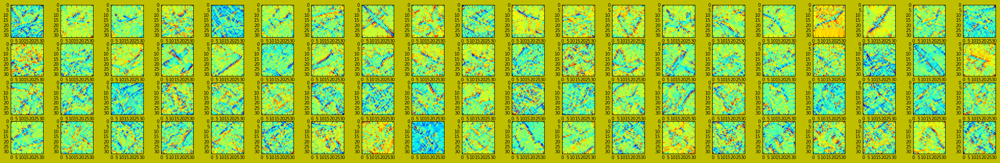

In [27]:
from __future__ import division
import numpy as np


def featureaMeanNorm(image):     
    return (image - np.mean(image, axis=0))  


def ZCA_whitening(img):
    epsilon =0.1
    img = featureaMeanNorm(img)
    sigma_mat = np.dot(img,np.transpose(img))/img.shape[1]
#     sigma_mat = np.cov(img, rowvar=True)
    U,S,_ = np.linalg.svd(sigma_mat)
    
    img_rot = np.dot(U.T, img)
    denominator = np.diag(1.0/np.sqrt(S+epsilon))
    PCA_whitening = np.dot(denominator, img_rot)
    
    ZCA_whitening = np.dot(U, PCA_whitening)
    return ZCA_whitening

imageZCA = [ZCA_whitening(img) for img in imageGray]
vizualize(imageZCA,rows=4,columns=20)

In [28]:
from scipy import misc
import tensorflow as tf

# def my_func(x):
#   # x will be a numpy array with the contents of the placeholder below
#   return np.sinh(x)
# inp = tf.placeholder(tf.float32)
# y = tf.py_func(my_func, [inp], tf.float32)

# with tf.Session() as sess:
#     sess.run(tf.initialize_all_variables())
#     sess.run(y)

a = np.array([1,2,3,4], dtype='float32')
b = np.array([[5,6,7,8],[9,8,1,2], [3,2,3,1],[4,5,1,3]], dtype='float32')


def pyfunction(inputIN):
    return np.array(inputIN + a)

def tfFunction():
    inp = tf.placeholder(tf.float32, [2,4])
    out = tf.py_func(pyfunction, [inp], tf.float32)
    
tfFunction()   
with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())    
    for inp_ in (b[0:2], b[2:4]):
        feed_dict = {inp:inp_}
        output = sess.run(out, feed_dict=feed_dict)
        print (pyfunction(inp_))

NameError: name 'inp' is not defined

In [ ]:
# # from sklearn.decomposition import PCA

# # # ZCA Whitening:
# def featureaMeanNorm(image):     
#     return (image - np.mean(image, axis=0))


# x = np.array([[1,2,3],[4,3,5],[2,3,4],[5,6,8]])

# print (np.mean(x, axis=0))
# x = featureaMeanNorm(x)
# sigma_mat = np.dot(x,np.transpose(x))/x.shape[1]
# u,s,_ = np.linalg.svd(sigma_mat)
# x_rot = np.dot(np.transpose(u),x)
# x_reduced = np.dot(np.transpose(u[:,0:2]), x)#x_rot[:,0:2]
# epsilon = 0.1

# denominator = np.diag(1/pow(s+epsilon,0.5))
# PCA_whitening = np.dot(denominator, x_rot)
# ZCA_whitening = np.dot(u, PCA_whitening)


# print ('x: ', x)
# print ('')
# print ('x_cov: ',sigma_mat)
# print ('')
# print ('u: ', u)
# print ('')
# print ('s', s)
# print ('')
# print ('x_rot: ', x_rot)
# print ('')
# print ('x_reduced: ', x_reduced)
# print ('')
# print ('pow(s_diag+epsilon,0.5): ', 1/pow(s+epsilon,0.5))
# print('')
# print ('PCA_whitening: ', PCA_whitening)
# print('')
# print ('ZCA_whitening: ', ZCA_whitening)

# print ('########################################################################################################################')


# def ZCA_whiteness(img):
# #     img = featureaMeanNorm(img)
#     epsilon =0.1
# #     sigma_mat = np.dot(img,np.transpose(img))/img.shape[1]
#     sigma_mat = np.cov(img, rowvar=True)
#     U,S,_ = np.linalg.svd(sigma_mat)
    
#     img_rot = np.dot(U.T, img)
#     denominator = np.diag(1.0/np.sqrt(S+epsilon))
#     PCA_whitening = np.dot(denominator, img_rot)
    
#     ZCA_whitening = np.dot(U, PCA_whitening)
#     return ZCA_whitening

# ZCA_whitening = ZCA_whiteness(np.array([[1,2,3],[4,3,5],[2,3,4],[5,6,8]]))



# print('###########')
# print ('ZCA_whitening: ', ZCA_whitening)

# print ('########################################################################################################################')



# def ZCA_whitening(X):
#     """
#     Function to compute ZCA whitening matrix (aka Mahalanobis whitening).
#     INPUT:  X: [M x N] matrix.
#         Rows: Variables
#         Columns: Observations
#     OUTPUT: ZCAMatrix: [M x M] matrix
#     """
#     # Covariance matrix [column-wise variables]: Sigma = (X-mu)' * (X-mu) / N
#     sigma = np.cov(X, rowvar=True) # [M x M]
#     # Singular Value Decomposition. X = U * np.diag(S) * V
#     U,S,V = np.linalg.svd(sigma)
#         # U: [M x M] eigenvectors of sigma.
#         # S: [M x 1] eigenvalues of sigma.
#         # V: [M x M] transpose of U
#     # Whitening constant: prevents division by zero
#     epsilon = 0.1# 1e-5
#     # ZCA Whitening matrix: U * Lambda * U'
#     ZCAMatrix = np.dot(U, np.dot(np.diag(1.0/np.sqrt(S + epsilon)), U.T)) # [M x M]
#     xZCAMatrix = np.dot(ZCAMatrix, X)
#     return xZCAMatrix


# ZCA_whitening = ZCA_whitening(np.array([[1,2,3],[4,3,5],[2,3,4],[5,6,8]]))
# print ('*************')
# print ('ZCA_whitening: ', ZCA_whitening)


# print ('########################################################################################################################')


# # # print (u[:,0:2])

# # print ('#################')
# # print ('')
# # decompose = PCA(n_components=2)
# # xx = decompose.fit_transform(x)
# # print (xx)
# # # print (decompose.explained_variance_ratio_)

In [ ]:
# # # decompose = PCA(n_components=3)
# # # x = decompose.fit_transform(x)
# from sklearn.decomposition import PCA

# x = np.array([[1,2,3],[4,3,5],[2,3,4],[5,6,8]])

# pca = PCA(whiten=True)
# transformed = pca.fit_transform(x)
# pca.whiten = False
# zca = pca.inverse_transform(transformed)

# print (zca)